In [1]:
# Pacotes essenciais
import pandas as pd
import numpy as np
import missingno as msno

# Pacote de plotagem
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
# Pacotes de pré-processamento
from scipy.stats import chi2_contingency
from sklearn.preprocessing import LabelEncoder
#import ppscore as pps
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

# Pacotes para tratamento de missing values
from sklearn.impute import KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import MinMaxScaler

In [3]:
# Pacotes para implementação de modelos de Machine Learning
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report,f1_score,confusion_matrix,accuracy_score,recall_score,precision_score
import lazypredict
from lazypredict.Supervised import LazyClassifier

# Pacote para otimização dos modelos
import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice


# models 
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

# **Introduction**

O presente código tem como objetivo o desenvolvimento de um algoritmo de machine learning capaz de prever o resultado da campanha de marketing de um banco, identificando se o usuário realizou o depósito ou não após a campanha.

Portanto o algoritmo deve ser capaz de classificar de maneira binária o resultado da campanha.

Com base nisto, será definido os seguintes objetivos:
- Identificar quais características são mais importantes para a realização da campanha de marketing, visando modificar futuramente a campanha focando nos aspectos que geram mais resultados.
- O modelo desenvolvido só será aceito com o valor de acurácia maior que 90%;

# **Visualization of data**

In [4]:
data = pd.read_csv("bank.csv",sep = ',')
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11162 entries, 0 to 11161
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        11162 non-null  int64 
 1   job        11162 non-null  object
 2   marital    11162 non-null  object
 3   education  11162 non-null  object
 4   default    11162 non-null  object
 5   balance    11162 non-null  int64 
 6   housing    11162 non-null  object
 7   loan       11162 non-null  object
 8   contact    11162 non-null  object
 9   day        11162 non-null  int64 
 10  month      11162 non-null  object
 11  duration   11162 non-null  int64 
 12  campaign   11162 non-null  int64 
 13  pdays      11162 non-null  int64 
 14  previous   11162 non-null  int64 
 15  poutcome   11162 non-null  object
 16  deposit    11162 non-null  object
dtypes: int64(7), object(10)
memory usage: 1.4+ MB


In [6]:
# verificando valores ausentes
miss_val = data.isnull().any().sum()
miss_val

0

Inicialmente não pode-se notar a ausência de dados ou inconsistência em alguma variável. 

Com base nisto, será feito uma análise exploratória dos dados e será analisado se alguma feature possui uma tendência ou correlação com a target (deposit).

# **Exploratory Data Analysis (EDA)**

In [7]:
data_categorical = data.select_dtypes(include='object')
data_numeric = data.select_dtypes(include='int64')
col_cat = data_categorical.columns # pegando no nome de todas as colunas de variáveis categóricas
col_num = data_numeric.columns # pegando no nome de todas as colunas de variáveis numéricas


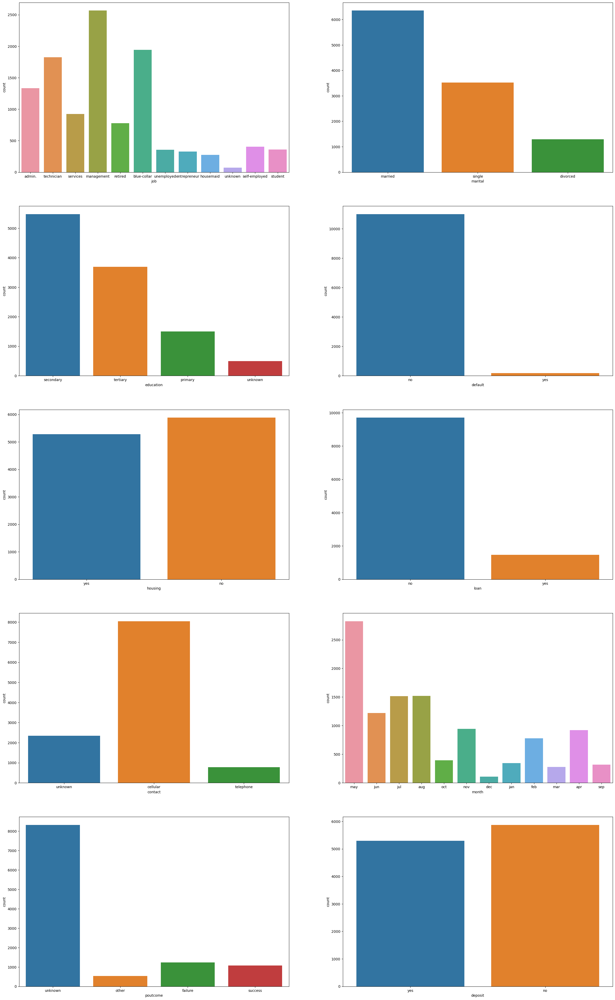

In [8]:
n = len(col_cat)

fig, ax = plt.subplots(round(n/2),2 ,figsize=(30,50), sharey=False)
axes = ax.flatten()

for i in range(0,n):
    sns.countplot(data= data, x = col_cat[i], ax=axes[i])

Analisando as variáveis categóricas temos:
- 'Poutcome' e 'contact' apresentam mais categorias do que as listadas pela referência do dataset, sendo para o 'poutcome' adicionado duas novas categorias e para a variável 'contact' existe mais uma nova categoria.
- A maioria dos contatos é feito pelo celular.
- O dataset parece balanceado em relação a variável target 'deposit'.
- A maioria dos entrevistados não possui personal loan.


Analisando as variáveis 'poutcome' e 'contact' vemos que para 'poutcome' existem duas novas categorias são 'unknown' e 'other', já para a variável 'contact' a nova categoria é 'unknown'.

Isto pode ter sido gerado pela perda de dados no armazenamento do dataset em seu banco de dados original, mas de alguma forma ao invés de ser identificado como um dado ausente ele foi categorizado desta forma.

Portanto, para uma melhor classificação destes dados, eles serão convertidos em formato 'NaN' e serão tratados como dados ausentes.

In [9]:
data['poutcome'] = data['poutcome'].replace({'unknown':np.NaN, 'other':np.NaN})
data['contact'] = data['contact'].replace('unknown',np.NaN)

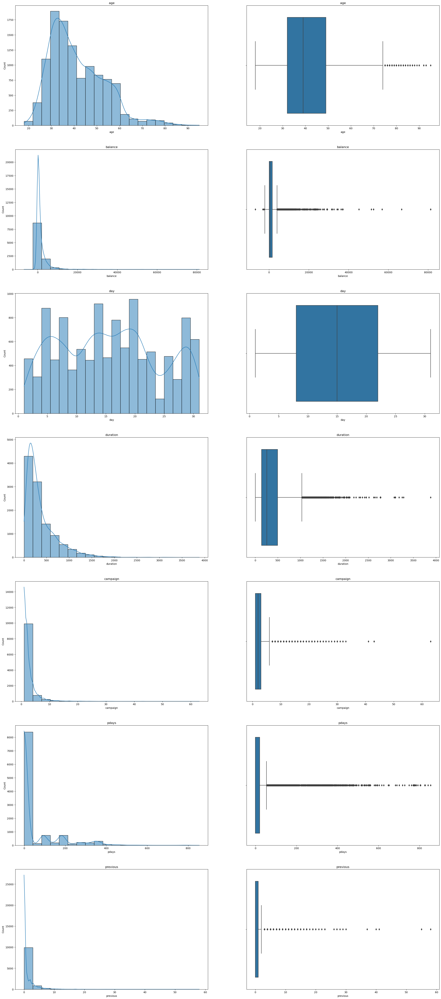

In [10]:
# verificando a distribuição dos dados numéricos
n = len(col_num)

fig, axes = plt.subplots(n, 2, figsize=(15*2,10*n), sharey=False)
for i in range(0,n):
    sns.histplot(data=data,x=col_num[i],bins=20, kde = True, ax=axes[i,0])
    axes[i,0].set_title(col_num[i])
    
    sns.boxplot(x=data[col_num[i]], ax = axes[i,1])
    axes[i,1].set_title(col_num[i])

In [11]:
data[col_num].describe()

,age,balance,day,duration,campaign,pdays,previous
count,11162.00,11162.00,11162.00,11162.00,11162.00,11162.00,11162.00
mean,41.23,1528.54,15.66,371.99,2.51,51.33,0.83
std,11.91,3225.41,8.42,347.13,2.72,108.76,2.29
min,18.00,-6847.00,1.00,2.00,1.00,-1.00,0.00
25%,32.00,122.00,8.00,138.00,1.00,-1.00,0.00
50%,39.00,550.00,15.00,255.00,2.00,-1.00,0.00
75%,49.00,1708.00,22.00,496.00,3.00,20.75,1.00
max,95.00,81204.00,31.00,3881.00,63.00,854.00,58.00


Analisando os dados numéricos tem-se:
- A média dos entrevistados está entre 30 a 50 anos.
- O valor de 'balance' está concentrado entre 0 e 4.000, porém possui pontos de valores muito elevados, chegando à valores de 80.000.
- A duaração das ligações possui em média entre 200 a 600 segundos.
- As variáveis 'duration' e 'balance' possuem valores muito distante da distribuição dos dados mas ainda podem ser considerados valores plausíveis para essas variáveis.
- Foram realizadas mais de 60 campanhas, mas a maioria dos dados pertence as campanhas iniciais (1 ao 5).

Com base nessas vizualizações será feito uma investigação para verificar se os valores elevados de 'balance' e 'duration' tem uma relação maior com o 'deposit'

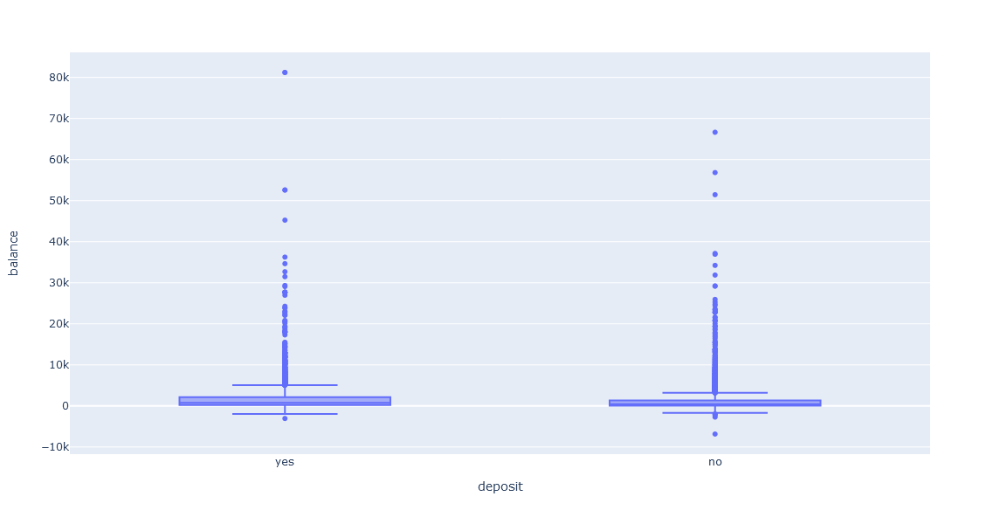

In [12]:
fig = px.box(data, x="deposit", y ="balance", width=1200, height=600)
fig.show()

Pelo gráfico de boxplot não observa-se uma relação entre os valores altos de balance e a taxa de depósito.  Com base nisto pode ser realizado a remoção destes outliers, já que eles não agregam em alguma classe em específico. Mas primeiro é necessário verificar o quanto de informação será perdida com a remoção destes dados

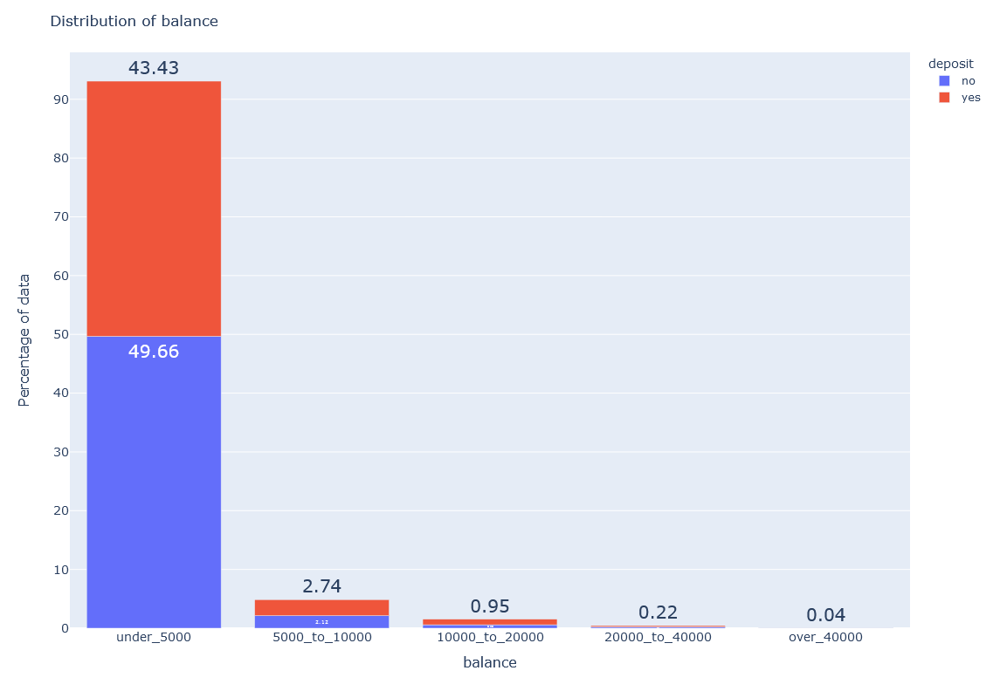

In [13]:
data['balance_range'] = pd.cut(data['balance'], bins=[-np.inf, 5000,10000,20000,40000, np.inf], labels=['under_5000','5000_to_10000','10000_to_20000','20000_to_40000','over_40000']) 
aux = data.groupby(['balance_range','deposit']).count()
aux['value'] = round(aux.iloc[:,0]*100/data.shape[0],2).to_frame()
aux.reset_index(inplace=True)
fig = px.bar(aux, x='balance_range', y = 'value', color='deposit', height=800,width=800,text = 'value')
fig.update_traces(textfont_size=20, textangle=0, textposition="outside")
fig.update_layout(title_text = "Distribution of balance", 
                       yaxis = dict(title='Percentage of data',titlefont_size=16,tickfont_size=14),
                       xaxis = dict(title='balance',titlefont_size=16,tickfont_size=14))
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig.show()

Observando a distribuição nota-se que será perdido cerca de 7% dos dados ao realizar a remoção destes outliers. Eu considero isto uma quantidade relevante de dados para ser retirada da análise. Com base nisto será removido os outliers que passam de 20.000 de balance.

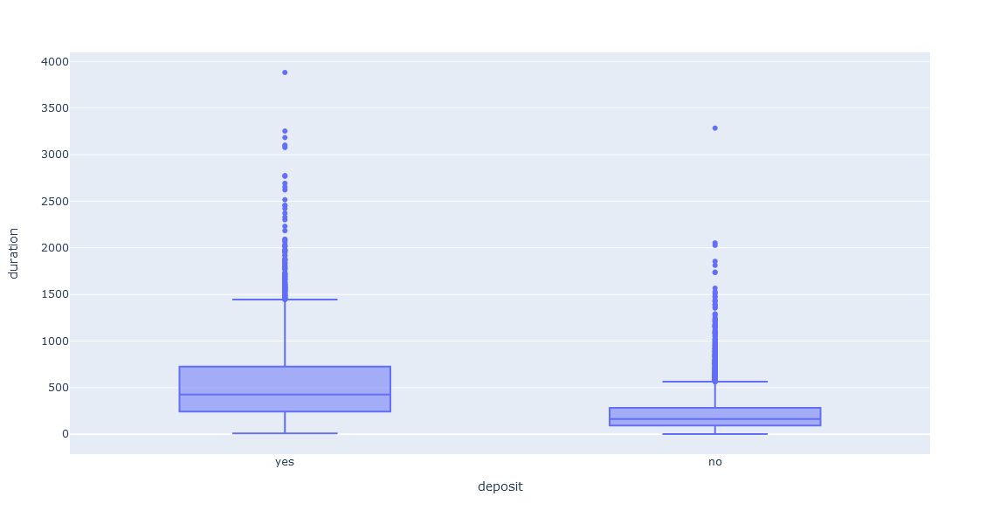

In [14]:
fig = px.box(data, x="deposit", y ="duration", width=1200, height=600)
fig.show()

Obsevando o gráfico vemos que a média e o range de duração da ligação para as pessoas que fizeram 'deposit' é maior do que as pessoas que não fizeram o 'deposit'. Com base nisto não será feito a remoção dos outliers já que estest outliers possuem uma certa relação com a variável target.

In [15]:
data.drop(data[data.balance>20000].index, inplace=True)
data.reset_index(inplace = True, drop =True)
data.drop('balance_range', axis=1, inplace = True)
data

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,NaN,5,may,1042,1,-1,0,NaN,yes
1,56,admin.,married,secondary,no,45,no,no,NaN,5,may,1467,1,-1,0,NaN,yes
2,41,technician,married,secondary,no,1270,yes,no,NaN,5,may,1389,1,-1,0,NaN,yes
3,55,services,married,secondary,no,2476,yes,no,NaN,5,may,579,1,-1,0,NaN,yes
4,54,admin.,married,tertiary,no,184,no,no,NaN,5,may,673,2,-1,0,NaN,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11100,33,blue-collar,single,primary,no,1,yes,no,cellular,20,apr,257,1,-1,0,NaN,no
11101,39,services,married,secondary,no,733,no,no,NaN,16,jun,83,4,-1,0,NaN,no
11102,32,technician,single,secondary,no,29,no,no,cellular,19,aug,156,2,-1,0,NaN,no
11103,43,technician,married,secondary,no,0,no,yes,cellular,8,may,9,2,172,5,failure,no


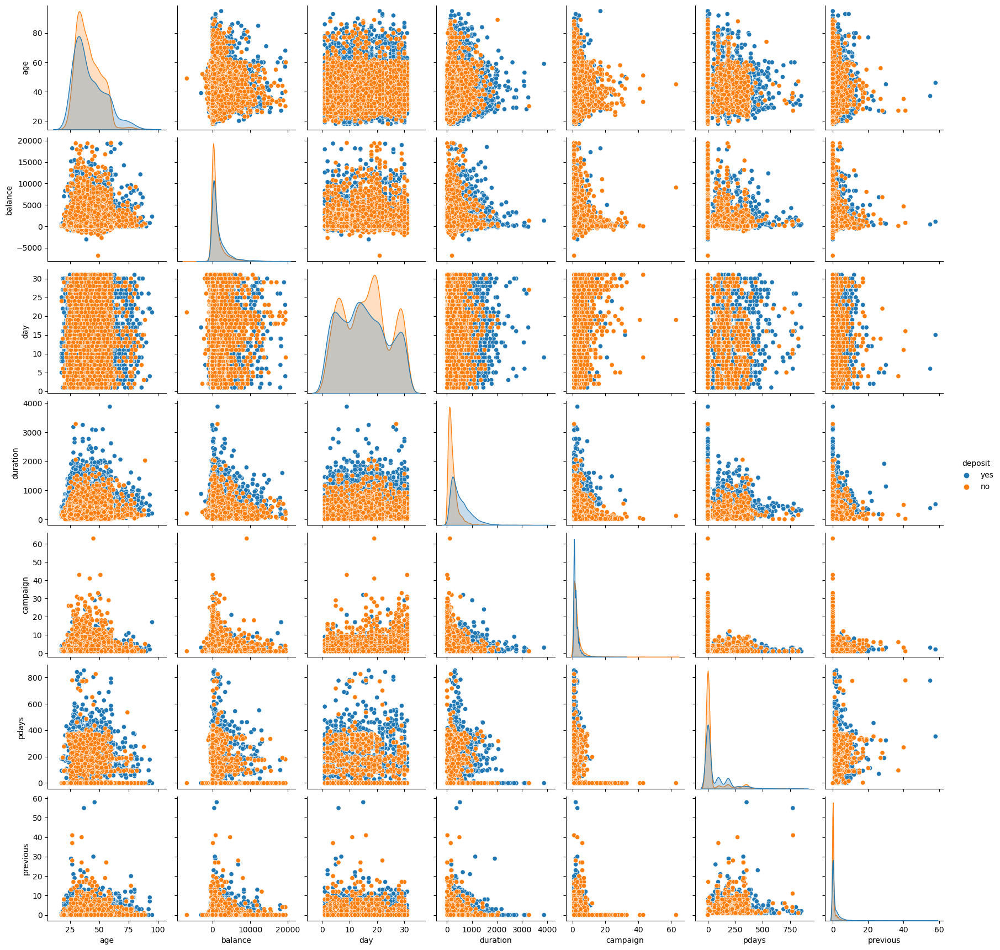

In [16]:
sns.pairplot(data, hue = 'deposit', dropna= True)

Analisando os gráficos de densidade categorizados pela variável target vemos que não existe uma distinção de distribuição expressiva entre eles. Isto indica que estes atributos podem ter pouca correlação com a variável target ou pouco impacto na hora de implementar o algoritmo de machine learning.

Analisando os plots de pares de variáveis tem-se as seguintes obeservações:
- No plot de 'balance' e 'duration' percebe-se que quanto menor é o balance maior é o valor da duração da chamada.
- Nota-se que no gráfico 'balance' e 'campaign', a tendencia do decorrer das campanhas é focar em valores de 'balance' menores .
- Nota-se que no plot 'campaign' e 'age' com o decorrer das campanhas o foco foi dado para idades entre 25 e 60 anos.
- Existe uma correlação entre 'campaign' e 'duration' onde com o passar das campanhas a tendência é a diminuição da duração da chamada.
- No plot de 'campaing' e 'pdays' nota-se que as campanhas finais foram direcionadas a clientes novos, com pdays = 0.
- Existe uma correlação entre 'previous' e 'duration' onde com o aumento de previous corre  a diminuição da duração da chamada.

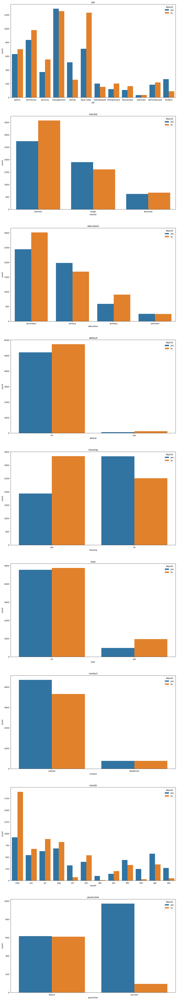

In [17]:
n = col_cat.shape[0]-1
fig, axes = plt.subplots(n, figsize=(15,10*n), sharey=False)

for i in range(0,n):
    sns.countplot(data=data, x=col_cat[i], hue='deposit',ax = axes[i]) 
    axes[i].set_title(col_cat[i])

Observando esses gráficos é possivel fazer algumas inferências:
- job:
    * Blue-collar tem maior tendência a ter rejeição da proposta de deposit;
    * Student e retire tem maior tendência  a ter aceitação da proposta de deposit;

- education:
    * Conforme o nivel de educação vai subindo maior é a tendencia a realizar o depósito;

- housing:
    * Se a pessoa já tiver crédito de habitação ela tem uma maior chance de não realizar o depósito;

- contact
    * Ligações por celular tem uma maior taxa de aceitação da proposta de deposit;

- month
    * Campanhas feitas no mes de 'may' tem maior tentencia de resultarem em fracasso;
    * Campanhas feitas no mes de 'sep', 'mar' e 'abr' tem maior tentencia de resultarem em sucesso;

# **Feature Engineering**

<h2> Treatment of missing data <h2>

Antes de começar aplicar técnicas de tratamento de dados ausente é necessário saber qual é o tipo de missing data está sendo tratada, para que assim a técnica aplicada seja a mais eficiente e evite aumentar o viés dos resultados futuramente.

There are three main types of missing data:

- Missing completely at random (MCAR): 

In thes case, there is no relationship between the missing data and any other values observed or unbserved within given dataset. That is, missing values are completely idependent of other data, without type of pattern.

In the case of MCAR, the data could be missing due to human error, some system/equipment failure, loss of sample, etc...

- Missing at random (MAR):

This case, MAR means that the reason for missing values can be explained by variables on which you have complete information as there is some relationship between the missing data and other values/data.
In this case, the data is not missing for all the observations. It is missing only within sub-samples of the data and there is some pattern in the missing values.

For example, if you check one survey data, you may find that all the people have answered their 'Gender' but 'Age' values are mostly missing for people who have answered their 'Gender' as 'female'.

- Missing not at random (MNAR):

If there is some structure/pattern in missing data and other observed data can not explain it, then it is missing not at random. If the missing data does not fall under the MCAR or MAR then it can be categorized as MNAR.

It can happen due to the reluctance of people in providing the required information. A specific group of people may not answer some questions in a survey. For example, suppose the name and the number of overdue books are asked in the poll for a library. So most of the people having no overdue books are likely to answer the poll. People having more overdue books are less likely to answer the poll.

So in this case, the missing value of the number of overdue books depends on the people who have more books overdue.

Com base nessas definições será feita uma avaliação dos missing datas por meio de um teste de hipótese para verificar se o mesmo pertence a categoria MCAR. Caso não pertença ele poderá ser MAR ou MNAR.
Como o dataset utilizado é uma parcela de um dataset maior, que pode ser obtido neste link: [Bank marketing dataset](https://archive.ics.uci.edu/ml/datasets/bank+marketing) , todos os dados que não forem MCAR será considerado MAR visto que não está sendo utilizado todos os dados para comprovar se o missing data seria do tipo MNAR ou foi uma amostra do dataset que pegou uma grande quantidade de missing data daquela feature.

<h1>Teste de hipótese para MCAR

Para comprovar se o missing value é do tipo MCAR ou não será feito o teste de chi², que é realizado entre duas variáveis categóricas, onde tem a seguinte hipótese nula:

- H0: (null hypothesis) the two variables are independent, in other words, the missing values of the first variable do not depend on the second variable.
- H1: (alternative hypothesis) The two variables are not independent .

Se para todas as variáveis categóricas a hipotese nula se provar verdadeira indica que o tipo de missing value é o MCAR, caso uma variável invalide a hipotese nula será considerado como MAR.

Como parâmetro para validação da hipótese nula o p-value deve ser maior que 0.05.

In [18]:
def test_miss_validation(dataframe, miss_name_col,corr_name_col):
    rows = []
    for i in miss_name_col:
        cols = []
        for j in corr_name_col:
            miss_val = dataframe[dataframe[i]==False].groupby(j)[i].count()
            true_val = dataframe[dataframe[i]==True].groupby(j)[i].count()
            
            # Verificando se a duas listas possuem a mesma quantidade de categorias
            len_1 = len(true_val)
            len_2 = len(miss_val)
            if len_1 <len_2:
                mux = tuple(miss_val.index)
                true_val = true_val.reindex(mux, fill_value=0)

            if len_1 >=len_2:
                mux = tuple(true_val.index)
                miss_val = miss_val.reindex(mux, fill_value=0)
            
            
            table_validation = np.transpose([true_val.values, miss_val.values])
            p_value = chi2_contingency(table_validation)[1]
            cols.append(round(p_value,6))
        
        rows.append(cols)
    
    t_results = np.array(rows)
    df = pd.DataFrame(t_results, columns = corr_name_col, index =miss_name_col)
    return df

In [19]:
miss_names = ['poutcome_miss','contact_miss']
cat_test = col_cat.to_list()
cat_test.remove('poutcome')
cat_test.remove('contact')

data['poutcome_miss'] = data['poutcome']
data['poutcome_miss'] = False
data.loc[data[data['poutcome'].isnull()].index, "poutcome_miss"] = True  # Marcando os valores faltantes como verdadeiro
##

data['contact_miss'] = data['contact']
data['contact_miss'] = False
data.loc[data[data['contact'].isnull()].index, "contact_miss"] = True  # Marcando os valores faltantes como verdadeiro

In [20]:
result_p = test_miss_validation(data, miss_names, cat_test)
result_p

,job,marital,education,default,housing,loan,month,deposit
poutcome_miss,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
contact_miss,0.00,0.00,0.00,0.00,0.00,0.18,0.00,0.00


Analisando a tabela de p-value obtida vemos que em todos os casos ocorre a invalidação da hipótese nula, comprovando assim que o tipo de missing value de todas as features é do tipo MAR.

Como este teste só é valido para duas variáveis categóricas, se todas as hipoteses nulas se provarem válidas deve ser feito o teste com as variáveis quantitativas por meio do T-test para comprovar que o missing value é do tipo MCAR.

Caso o dataset utilizado fosse o completo, a feature 'poutcome' seria classificada como MNAR, visto a sua ausência elevada e os baixos valores de p-value e caso o t-test também apresenta-se baixa correlação.

<h2> Treatment of missing values <h2>

Explicar como será feito o tratamento de dados ausentes

<h2> Enconding Categorical features <h2>

Para realizar o enconding das variáveis categoricas é necessario saber algumas informações, a primeira e mais importante é se a variável é ordinal ou nominal.

Caso ela seja ordinal o enconding será levando em consideração a hierarquida desta variável, sendo a classe mais baixa classificada com o menor valor como o 1, e a mais alta com o maior valor, para que no momento de implementação do algoritmo o maior valor tenha mais impacto no modelo.

Caso ela seja nominal o enconding será feito utilizando o one-hot-enconding, que simplificando seria a transformação das categorias em novas colunas do dataframe de forma binária.

In [21]:
data[col_cat].head()

,job,marital,education,default,housing,loan,contact,month,poutcome,deposit
0,admin.,married,secondary,no,yes,no,NaN,may,NaN,yes
1,admin.,married,secondary,no,no,no,NaN,may,NaN,yes
2,technician,married,secondary,no,yes,no,NaN,may,NaN,yes
3,services,married,secondary,no,yes,no,NaN,may,NaN,yes
4,admin.,married,tertiary,no,no,no,NaN,may,NaN,yes


No total temos 10 variáveis categóricas.

Analisando o gráfico de distribuição de dados feito anteriormente nota-se que as variáveis 'job', 'marital', 'education' e 'month' possuem mais de duas categorias.

No caso da variável 'job' os tipos de emprego não possuem uma ordem hierárquica, sendo classificado como uma variável nominal. Neste caso foi classificado como não-hierárquico pois este dataset foi feito com base em pessoas não relacionadas, mas caso fosse feito com base em uma empresa em específico poderia ser considerado hieráriquico com base na estrutura de classificação de cargo da empresa.

Analisando a variável 'marital' não é possível observar nenhuma hierarquia em relação as classes, sendo classificada como uma variável nominal.

Para a variável 'education' o nível de escolaridade possui uma ordem hierárquica onde a classe 'tertiary' é acima de 'secondary' por assim em diante.

No caso da variável 'month' ocorre um caso mais específico, onde é uma variável que possui ordem, onde o mês de 'feb' vem antes de 'may', possuindo assim uma hierarquia, porém é ciclico, onde após o mês de 'dec' vem o mês de 'jan' novamente. Com isso será feito um tratamento específico para a feature 'month' visando tornar os dados mais ciclicos.

As demais variáveis serão convertidas em formato binário de 0 e 1.

In [22]:
# one-hot-encodind using get_dummies() for job and marital:
data_encoded = data.copy()
data_encoded = pd.get_dummies(data_encoded, columns = ['job', 'marital'])
data_encoded.head()

,age,education,default,balance,housing,loan,contact,day,month,duration,...,job_retired,job_self-employed,job_services,job_student,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single
0,59,secondary,no,2343,yes,no,NaN,5,may,1042,...,0,0,0,0,0,0,0,0,1,0
1,56,secondary,no,45,no,no,NaN,5,may,1467,...,0,0,0,0,0,0,0,0,1,0
2,41,secondary,no,1270,yes,no,NaN,5,may,1389,...,0,0,0,0,1,0,0,0,1,0
3,55,secondary,no,2476,yes,no,NaN,5,may,579,...,0,0,1,0,0,0,0,0,1,0
4,54,tertiary,no,184,no,no,NaN,5,may,673,...,0,0,0,0,0,0,0,0,1,0


In [23]:
# label enconding for feature 'education' 
# transformando a feature 'education' em tipo categórico
data_encoded['education'] = data_encoded['education'].astype('category')
data_encoded['education']=data_encoded['education'].cat.codes
data_encoded['education']

0        1
1        1
2        1
3        1
4        2
        ..
11100    0
11101    1
11102    1
11103    1
11104    1
Name: education, Length: 11105, dtype: int8

In [24]:
# Transformando a variável 'month' de categórica para quantitativa
label_encoder = LabelEncoder()
data_encoded['month'] = label_encoder.fit_transform(data_encoded['month'])+1 # usando label encoder ele começa a transformação usando 0 não o 1

# Transformando a variável 'month' em sin e cos
max_val = data_encoded['month'].max()
data_encoded['month_sin'] = np.sin(2 * np.pi *data_encoded['month']/max_val)
data_encoded['month_cos'] = np.cos(2 * np.pi * data_encoded['month']/max_val)

# Transformando a variável 'day' em sin e cos
max_val = data_encoded['day'].max()
data_encoded['day_sin'] = np.sin(2 * np.pi *data_encoded['day']/max_val)
data_encoded['day_cos'] = np.cos(2 * np.pi * data_encoded['day']/max_val)

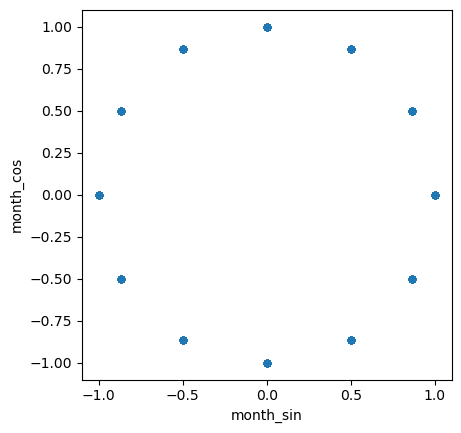

In [25]:
ax = data_encoded.plot.scatter('month_sin', 'month_cos').set_aspect('equal')

In [26]:
data_encoded['contact']

0             NaN
1             NaN
2             NaN
3             NaN
4             NaN
           ...   
11100    cellular
11101         NaN
11102    cellular
11103    cellular
11104    cellular
Name: contact, Length: 11105, dtype: object

In [27]:
# Usando label encoder para as demais variáveis categóricas
name_cat =col_cat.to_list()
name_cat.remove('education')
name_cat.remove('job')
name_cat.remove('marital')
name_cat.remove('month')

data_encoded['poutcome'] = data_encoded['poutcome'].replace({np.NaN:'unknown'})
data_encoded['contact'] = data_encoded['contact'].replace({np.NaN:'unknown'})

label_encoder = LabelEncoder()

for i in name_cat:
    data_encoded[i] = label_encoder.fit_transform(data_encoded[i])
    
data_encoded['poutcome'].value_counts()

2    8816
0    1225
1    1064
Name: poutcome, dtype: int64

Como os dados ausentes foram transformados em uma nova categoria é necessário transformá-los em formato 'NaN' novamente

In [28]:
# Replace the category with NaN values
data_encoded['poutcome'] = data_encoded['poutcome'].replace(2,np.NaN)
data_encoded['contact'] = data_encoded['contact'].replace(2,np.NaN)

<h3> Scaling data <h3>

In [29]:
#  Escalonando o dataset para aplicar o KNNimpute
scaler = MinMaxScaler()
data_scaler = pd.DataFrame(scaler.fit_transform(data_encoded), columns = data_encoded.columns)
data_scaler.drop(columns = ['deposit'],inplace=True)
data_scaler.head()

,age,education,default,balance,housing,loan,contact,day,month,duration,...,job_technician,job_unemployed,job_unknown,marital_divorced,marital_married,marital_single,month_sin,month_cos,day_sin,day_cos
0,0.53,0.33,0.00,0.35,1.00,0.00,NaN,0.13,0.73,0.27,...,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.50,0.92,0.76
1,0.49,0.33,0.00,0.26,0.00,0.00,NaN,0.13,0.73,0.38,...,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.50,0.92,0.76
2,0.30,0.33,0.00,0.31,1.00,0.00,NaN,0.13,0.73,0.36,...,1.00,0.00,0.00,0.00,1.00,0.00,0.00,0.50,0.92,0.76
3,0.48,0.33,0.00,0.35,1.00,0.00,NaN,0.13,0.73,0.15,...,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.50,0.92,0.76
4,0.47,0.67,0.00,0.27,0.00,0.00,NaN,0.13,0.73,0.17,...,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.50,0.92,0.76


<h3> MICE implementation <h3>

In [30]:
imputer = IterativeImputer(imputation_order='ascending',max_iter=1000,random_state=0,n_nearest_features=None)

In [31]:
data_end = pd.DataFrame(imputer.fit_transform(data_scaler),columns = data_scaler.columns)

In [32]:
data_end['poutcome'] = data_end['poutcome'].round(decimals=0)
data_end['contact'] = data_end['contact'].round(decimals=0)
data_end['poutcome'].value_counts()

1.00    8049
0.00    3056
Name: poutcome, dtype: int64

In [33]:
data_end['contact'].value_counts()

0.00    10339
1.00      766
Name: contact, dtype: int64

# **Correlation**

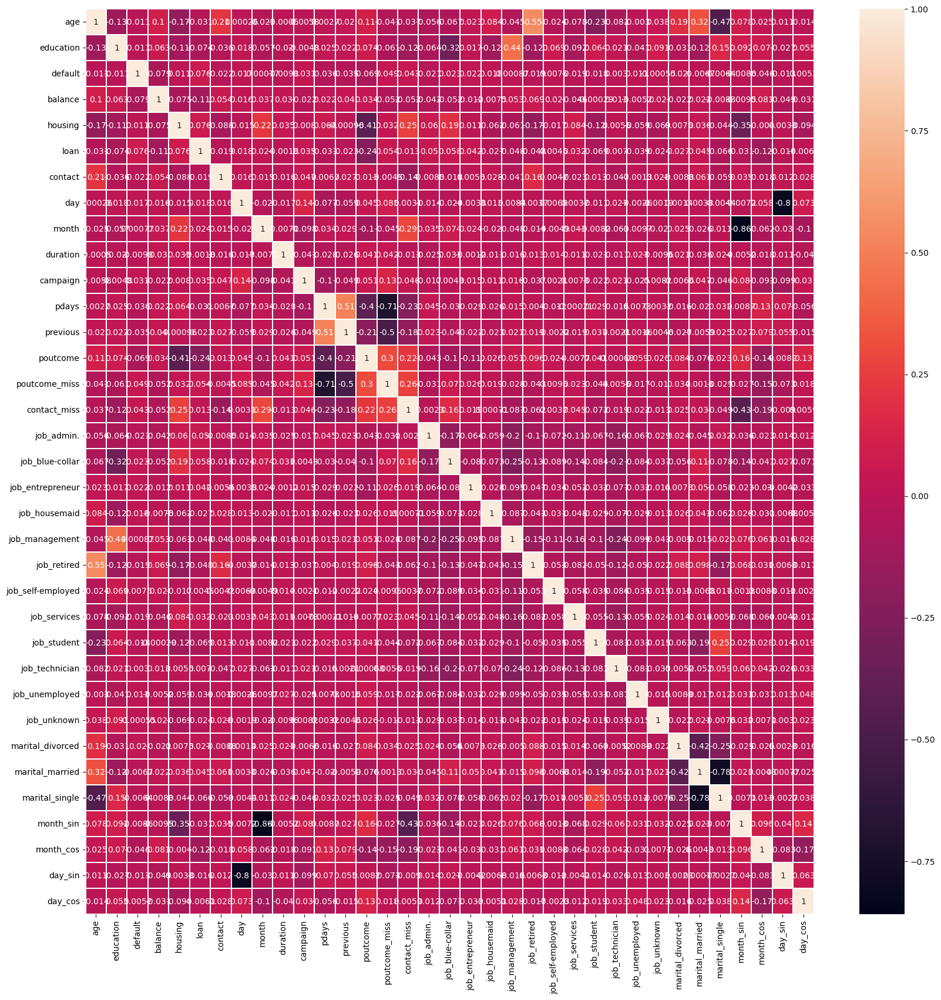

In [34]:
fig, axes = plt.subplots(1, figsize=(20,20))
pearson_matrix = data_end.corr(method='pearson')
fig = sns.heatmap(pearson_matrix, annot=True,linewidths=.1)

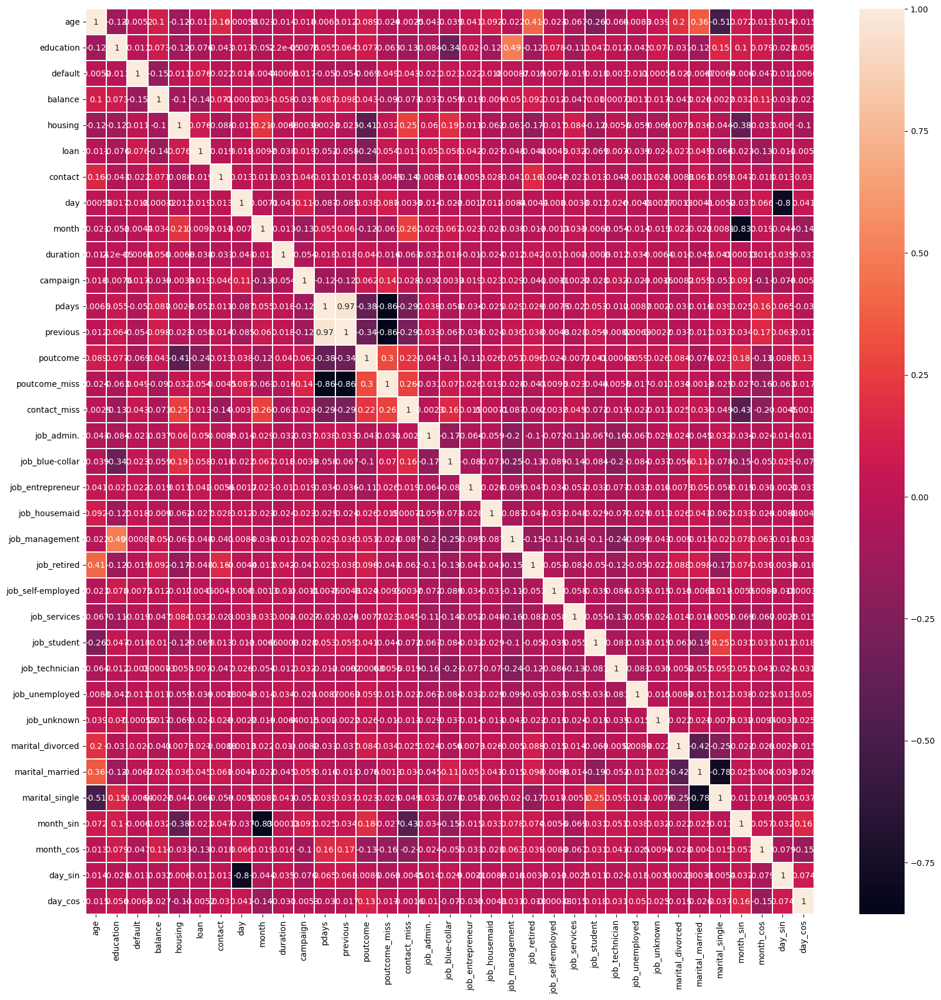

In [35]:
fig, axes = plt.subplots(1, figsize=(20,20), sharey=False)
spearman_matrix = data_end.corr(method='spearman')
fig = sns.heatmap(spearman_matrix, annot=True,linewidths=.3)

Obeservando as matrizes de correlação não existe que tenha uma correlação expressiva com outra. A que possui a maior correlação é a variável 'marital_married' com 'marital_single' possuindo 0.78 de correção em pearson e spearman. Como o valor de corte inicialmente estabelecido foi de 0.85 para remoção de features não foi atingido nenhuma variável será removida.

# **Model Implementation**

In [36]:
X = data_end
y= data_encoded['deposit']
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=.2,random_state =0)

In [37]:
lazy_model = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = lazy_model.fit(X_train, X_test, y_train, y_test)
models

100%|██████████| 29/29 [00:28<00:00,  1.02it/s]


,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
RandomForestClassifier,0.85,0.85,0.85,0.85,0.87
LGBMClassifier,0.85,0.85,0.85,0.85,0.39
XGBClassifier,0.85,0.85,0.85,0.85,0.53
ExtraTreesClassifier,0.83,0.83,0.83,0.83,0.85
BaggingClassifier,0.83,0.83,0.83,0.83,0.51
AdaBoostClassifier,0.83,0.82,0.82,0.83,0.62
SVC,0.82,0.82,0.82,0.82,2.81
NuSVC,0.82,0.82,0.82,0.82,3.85
LogisticRegression,0.80,0.80,0.80,0.80,0.07


# Random Forest

In [38]:
model_RF = Pipeline([('RF', RandomForestClassifier(random_state=0))])

In [83]:
# definindo os hiperparâmetros a serem avaliados
def Objective_RF(trial):
    RF__max_depth = trial.suggest_int('RF__max_depth',200,800)
    RF__n_estimators = trial.suggest_int('RF__n_estimators',100,600)
    RF__min_samples_split = trial.suggest_int('RF__min_samples_split',2,20)
    RF__min_samples_leaf = trial.suggest_int('RF__min_samples_leaf',1,10)    
    RF__max_leaf_nodes = trial.suggest_int('RF__max_leaf_nodes',300,800)
    
    params = {
        'RF__max_depth': RF__max_depth,
        'RF__n_estimators':  RF__n_estimators,
        'RF__min_samples_split' : RF__min_samples_split,
        'RF__min_samples_leaf' : RF__min_samples_leaf,
        'RF__max_leaf_nodes' : RF__max_leaf_nodes
    }
    
    model = model_RF.set_params(**params)
    pre = cross_val_score(model, X_train, y_train, cv=4, scoring='precision')
    
    return pre.mean()

In [84]:
study_RF = optuna.create_study(directions = ["maximize"])
study_RF.optimize(Objective_RF, n_trials = 100, show_progress_bar = True)

  0%|          | 0/100 [00:00<?, ?it/s]

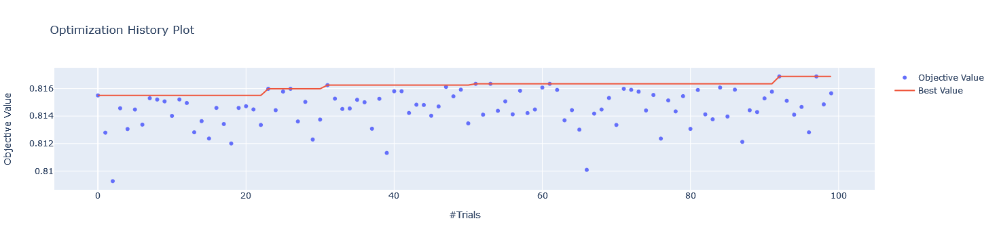

In [85]:
plot_optimization_history(study_RF)

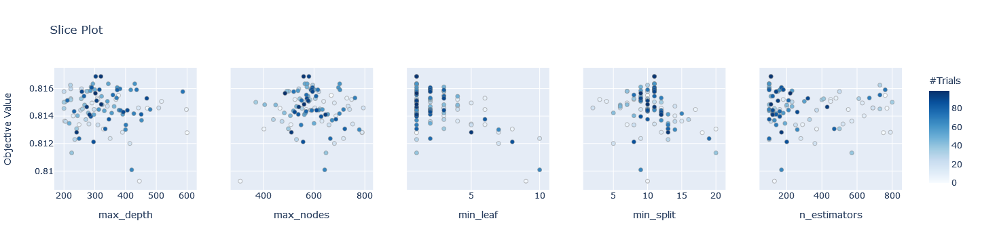

In [86]:
plot_slice(study_RF)

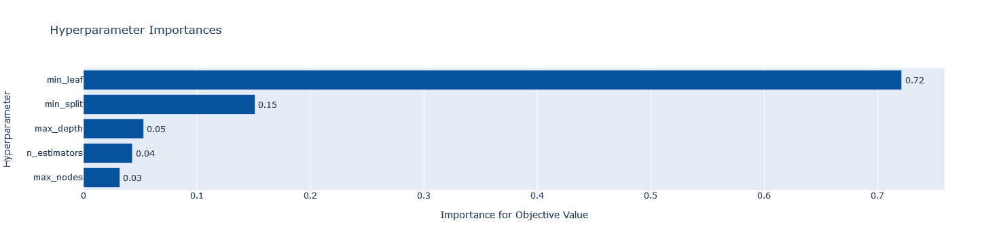

In [87]:
plot_param_importances(study_RF)

In [88]:
model = model_RF.set_params(**study_RF.best_params)
model.fit(X_train,y_train)
prediction = model.predict(X_test)

# Verificando a precisão do modelo
matrix=confusion_matrix(y_test,prediction)
print(matrix)
score=precision_score(y_test,prediction)
print(score)
report=classification_report(y_test,prediction)
print(report)

[[958 201]
 [126 936]]
0.8232189973614775
              precision    recall  f1-score   support

           0       0.88      0.83      0.85      1159
           1       0.82      0.88      0.85      1062

    accuracy                           0.85      2221
   macro avg       0.85      0.85      0.85      2221
weighted avg       0.85      0.85      0.85      2221



# LGBMClassifier

In [79]:
from lightgbm import LGBMClassifier
model_LGBM = Pipeline([('LGBM', LGBMClassifier(random_state=0, metric = "l2"))])

In [80]:
def Objective_LGBM(trial):
    
    LGBM__boosting_type = trial.suggest_categorical('boosting',['gbdt','dart','goss']) #pode dar erro por ter modelos diferentes
    LGBM__num_leaves = trial.suggest_int('n_leaves',10,100)
    LGBM__max_depth = trial.suggest_int('max_depth',-1,99,step=10)
    LGBM__learning_rate = trial.suggest_float('learning_rate',0.001,1)
    LGBM__num_iterations = trial.suggest_int('num_iterations',50,500,step = 50)
    LGBM__reg_alpha = trial.suggest_float('reg_alpha',0,10)
    LGBM__reg_lambda = trial.suggest_float('reg_lambda',0,10)
    
    
    params = {
        'LGBM__boosting_type' : LGBM__boosting_type,
        'LGBM__num_leaves' : LGBM__num_leaves,
        'LGBM__max_depth' : LGBM__max_depth,
        'LGBM__learning_rate' : LGBM__learning_rate,
        'LGBM__num_iterations' : LGBM__num_iterations,
        'LGBM__reg_alpha' : LGBM__reg_alpha,
        'LGBM__reg_lambda' : LGBM__reg_lambda, 
    }
    
    model = model_LGBM.set_params(**params)
    acc = cross_val_score(model, X_train, y_train, cv=5, scoring='precision')
    
    return acc.mean()

In [81]:
study_LGBM = optuna.create_study(directions = ["maximize"])
study_LGBM.optimize(Objective_LGBM, n_trials = 200, show_progress_bar = True)

  0%|          | 0/200 [00:00<?, ?it/s]

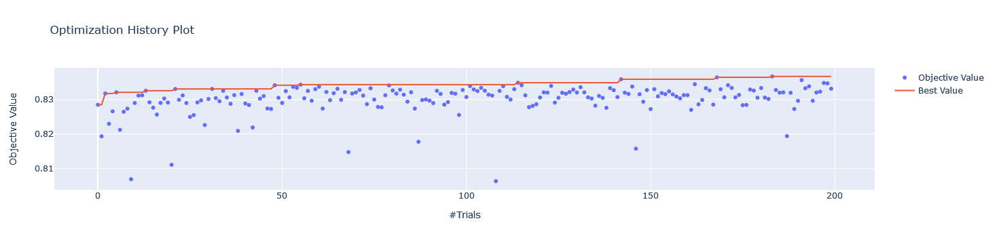

In [82]:
plot_optimization_history(study_LGBM)

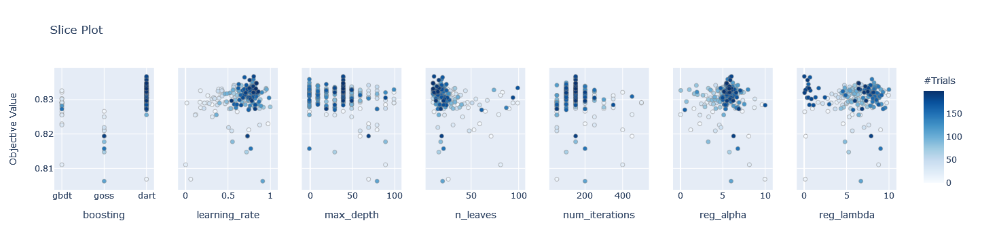

In [83]:
plot_slice(study_LGBM)

In [74]:
study_LGBM.best_trial.values

[0.8355589137408284]

In [75]:
model = model_LGBM.set_params(LGBM__boosting_type=study_LGBM.best_params['boosting'], LGBM__num_leaves = study_LGBM.best_params['n_leaves'], LGBM__max_depth = study_LGBM.best_params['max_depth'],
                             LGBM__learning_rate = study_LGBM.best_params['learning_rate'], LGBM__num_iterations = study_LGBM.best_params['num_iterations'],
                             LGBM__reg_alpha = study_LGBM.best_params['reg_alpha'], LGBM__reg_lambda = study_LGBM.best_params['reg_lambda'])


model.fit(X_train,y_train)
prediction = model.predict(X_test)

# Verificando a precisão do modelo
matrix=confusion_matrix(y_test,prediction)
print(matrix)
#score=accuracy_score(y_test,prediction)
score = precision_score(y_test,prediction)
print(score)
report=classification_report(y_test,prediction)
print(report)

[[969 190]
 [120 942]]
0.8321554770318021
              precision    recall  f1-score   support

           0       0.89      0.84      0.86      1159
           1       0.83      0.89      0.86      1062

    accuracy                           0.86      2221
   macro avg       0.86      0.86      0.86      2221
weighted avg       0.86      0.86      0.86      2221



# XGBClassifier

In [88]:
from xgboost import XGBClassifier
model_XGB = Pipeline([('XGB', XGBClassifier(random_state=0,eval_metric = 'logloss') )])

In [89]:
def Objective_XGB(trial):
    n_estimators = trial.suggest_int('n_estimators',50,500,step=50)
    max_depth = trial.suggest_int('max_depth',10,150,step=10)
    max_leaves = trial.suggest_int('max_leaves',0,100)
    learning_rate = trial.suggest_float('learning_rate',0.001,2)
    booster = trial.suggest_categorical('booster',['gbtree', 'dart'])
    min_child_weight = trial.suggest_float('min_weight',0.001,10)
    max_delta_step = trial.suggest_float('delta_step',0.001,2)
    reg_alpha = trial.suggest_float('reg_alpha',0,10)
    
    params = {
        'XGB__n_estimators' : n_estimators,
        'XGB__max_depth' : max_depth,
        'XGB__max_leaves' : max_leaves,
        'XGB__learning_rate' : learning_rate,
        'XGB__booster' : booster,
        'XGB__min_child_weight' : min_child_weight,
        'XGB__max_delta_step' : max_delta_step,
        'XGB__reg_alpha' : reg_alpha
    }
    
    model = model_XGB.set_params(**params)
    acc = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')
    
    return acc.mean()  

In [90]:
study_XGB = optuna.create_study(directions = ["maximize"])
study_XGB.optimize(Objective_XGB, n_trials = 200, show_progress_bar = True)

  0%|          | 0/200 [00:00<?, ?it/s]

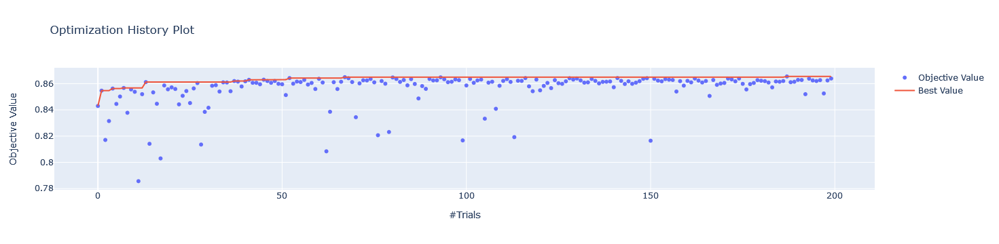

In [91]:
plot_optimization_history(study_XGB)

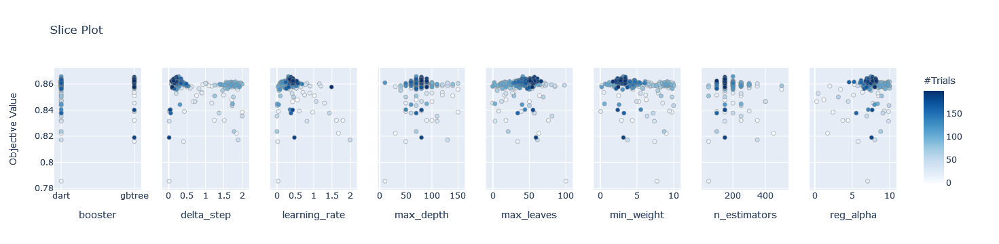

In [58]:
plot_slice(study_XGB)

In [59]:
study_XGB.best_trial.values

[0.8658260962143911]

In [61]:
model = model_XGB.set_params(XGB__n_estimators=study_XGB.best_params['n_estimators'],XGB__max_depth = study_XGB.best_params['max_depth'],XGB__max_leaves = study_XGB.best_params['max_leaves'],
                            XGB__learning_rate = study_XGB.best_params['learning_rate'], XGB__booster = study_XGB.best_params['booster'], XGB__min_child_weight = study_XGB.best_params['min_weight'],
                            XGB__max_delta_step = study_XGB.best_params['delta_step'], XGB__reg_alpha = study_XGB.best_params['reg_alpha'])


model.fit(X_train,y_train)
prediction = model.predict(X_test)

# Verificando a precisão do modelo
matrix=confusion_matrix(y_test,prediction)
df_cm = pd.DataFrame(matrix,index=['0','1'],columns=['0','1'])
s = sns.heatmap(df_cm, annot= True)
s.set(xlabel='Target', ylabel='Predicted')

report=classification_report(y_test,prediction)
print(report)

[[974 185]
 [119 943]]
0.8631247185952273
              precision    recall  f1-score   support

           0       0.89      0.84      0.87      1159
           1       0.84      0.89      0.86      1062

    accuracy                           0.86      2221
   macro avg       0.86      0.86      0.86      2221
weighted avg       0.86      0.86      0.86      2221

